<a href="https://colab.research.google.com/github/michaelawe01/Bournemouth-Uni-Data-Science-/blob/main/Final_Sub_Ai_Assesment3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
!pip install scikit-optimize
!pip install statsmodels
!pip install pandas_profiling
!pip install --upgrade matplotlib
!pip install --upgrade statsmodels

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 2.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 40.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 54.4 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.6.3
    Uninstalling matplotlib-3.6.3:
      Successfully uninstalled matplotlib-3.6.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.1.2 requires matplotlib<3.7,>=3.2, but you have matplotlib 3.7.1 which is incompatible.


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 41.3 MB/s eta 0:00:00
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.13.5
    Uninstalling statsmodels-0.13.5:
      Successfully uninstalled statsmodels-0.13.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.1.2 requires matplotlib<3.7,>=3.2, but you have matplotlib 3.7.1 which is incompatible.
ydata-profiling 4.1.2 requires statsmodels<0.14,>=0.13.2, but you have statsmodels 0.14.0 which is incompatible.


In [ ]:
import pandas as pd
import numpy as np
import datetime

import pandas_profiling

#used to generated random value and input them in our dataset
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.dates as mdates

from statsmodels.tsa.stattools import adfuller
import statsmodels.formula.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error


# import some classification models and functions
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

import xgboost as xgb
from xgboost import XGBRegressor
import os
import warnings
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss, ccf
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from math import sqrt

<ipython-input-2-e0f0f15a248d>:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


# Import Dataset

1.   Energy generation data set
2.   Weather Dataset


In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')
#p_energy_ds = pd.read_csv('/content/drive/MyDrive/s_energy_ds.csv')
#p_weather_ds = pd.read_csv('/content/drive/MyDrive/s_weather_ds.csv')

#Please upload dataset from subitted folder
from google.colab import files
uploaded = files.upload()

p_energy_ds = pd.read_csv('s_energy_ds.csv')
p_weather_ds = pd.read_csv('s_weather_ds.csv')

Saving s_energy_ds.csv to s_energy_ds.csv
Saving s_weather_ds.csv to s_weather_ds.csv


# Dataset Information

In [ ]:
p_energy_ds.head(2)
#show 2 lines from our energy data set

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.1,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.1,64.92


In [ ]:
p_weather_ds.head(2)
#show 2 lines from our weather data set

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [ ]:
p_energy_ds.shape
#returns the shape of the data; We have 35064 instances/rows and 29feature/columns in our raw data

(35064, 29)

In [ ]:
p_weather_ds.shape
#returns the shape of the data; We have 178396 instances/rows and 17 feature/columns in our raw data

(178396, 17)

In [ ]:
p_energy_ds.info()
#give extra info the eneergy data set. The dataset has 2 columns with null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 29 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time                                         35064 non-null  object 
 1   generation biomass                           35045 non-null  float64
 2   generation fossil brown coal/lignite         35046 non-null  float64
 3   generation fossil coal-derived gas           35046 non-null  float64
 4   generation fossil gas                        35046 non-null  float64
 5   generation fossil hard coal                  35046 non-null  float64
 6   generation fossil oil                        35045 non-null  float64
 7   generation fossil oil shale                  35046 non-null  float64
 8   generation fossil peat                       35046 non-null  float64
 9   generation geothermal                        35046 non-null  float64
 10

In [ ]:
p_weather_ds.info()
#give extra info the weather data set

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178396 entries, 0 to 178395
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   dt_iso               178396 non-null  object 
 1   city_name            178396 non-null  object 
 2   temp                 178396 non-null  float64
 3   temp_min             178396 non-null  float64
 4   temp_max             178396 non-null  float64
 5   pressure             178396 non-null  int64  
 6   humidity             178396 non-null  int64  
 7   wind_speed           178396 non-null  int64  
 8   wind_deg             178396 non-null  int64  
 9   rain_1h              178396 non-null  float64
 10  rain_3h              178396 non-null  float64
 11  snow_3h              178396 non-null  float64
 12  clouds_all           178396 non-null  int64  
 13  weather_id           178396 non-null  int64  
 14  weather_main         178396 non-null  object 
 15  weather_descripti

# Dataset Preprocessing
1) Energy dataset preprocessing
2) Weather data set preprocessing

## 1) Energy dataset preprocessing

In [ ]:
#The data frame columns where categorised and renamed for proper analysis. there where many columns that
#belong to the same group and many colomns that had null values. columns that are not required where also dropped

p_energy_ds['hourly_time'] = p_energy_ds['time']
p_energy_ds['tot_waste_gen'] = p_energy_ds['generation biomass'] + p_energy_ds['generation waste']
p_energy_ds['tot_fossil_gen'] = p_energy_ds['generation fossil brown coal/lignite'] + p_energy_ds['generation fossil coal-derived gas'] + p_energy_ds['generation fossil gas'] + p_energy_ds['generation fossil hard coal'] + p_energy_ds['generation fossil oil'] + p_energy_ds['generation fossil oil shale'] + p_energy_ds['generation fossil peat'] + p_energy_ds['generation fossil peat']
p_energy_ds['tot_hydro_gen'] =   p_energy_ds['generation hydro run-of-river and poundage'] + p_energy_ds['generation hydro water reservoir'] + p_energy_ds['generation marine'] + p_energy_ds['generation hydro pumped storage consumption']
p_energy_ds['tot_nuclear_gen'] = p_energy_ds['generation nuclear']
p_energy_ds['tot_other_gen'] = p_energy_ds['generation other'] + p_energy_ds['generation other renewable']
p_energy_ds['tot_wind_gen'] = p_energy_ds['generation wind offshore'] + p_energy_ds['generation wind onshore']
p_energy_ds['tot_solar_gen'] = p_energy_ds['generation solar']
p_energy_ds['tot_act_load'] = p_energy_ds['total load actual']


p_energy_ds['tot_energy_gen'] = p_energy_ds['tot_waste_gen'] + p_energy_ds['tot_fossil_gen'] + p_energy_ds['tot_hydro_gen'] + p_energy_ds['tot_nuclear_gen'] + p_energy_ds['tot_other_gen'] + p_energy_ds['tot_wind_gen'] + p_energy_ds['tot_solar_gen']

p_energy_ds = p_energy_ds.drop(columns=['time', 'total load forecast', 'total load actual', 'price day ahead', 'price actual', 'forecast solar day ahead',
                                        'forecast wind offshore eday ahead', 'forecast wind onshore day ahead', 'generation biomass',
                                        'generation fossil brown coal/lignite','generation fossil coal-derived gas', 'generation fossil gas',
                                        'generation fossil hard coal', 'generation fossil oil','generation fossil oil shale', 'generation fossil peat',
                                        'generation geothermal', 'generation hydro pumped storage aggregated', 'generation hydro pumped storage consumption',
                                        'generation hydro run-of-river and poundage', 'generation hydro water reservoir', 'generation marine', 'generation nuclear',
                                        'generation other', 'generation other renewable', 'generation solar', 'generation waste', 'generation wind offshore',
                                        'generation wind onshore'],axis=1)

p_energy_ds.head(2)

,hourly_time,tot_waste_gen,tot_fossil_gen,tot_hydro_gen,tot_nuclear_gen,tot_other_gen,tot_wind_gen,tot_solar_gen,tot_act_load,tot_energy_gen
0,2015-01-01 00:00:00+01:00,643.0,10156.0,3813.0,7096.0,116.0,6378.0,49.0,25385.0,28251.0
1,2015-01-01 01:00:00+01:00,644.0,10437.0,3587.0,7096.0,114.0,5890.0,50.0,24382.0,27818.0


In [ ]:
p_energy_ds.isnull().sum()

#this shows that we have null values in the P_energy_ds data set.

hourly_time         0
tot_waste_gen      20
tot_fossil_gen     19
tot_hydro_gen      21
tot_nuclear_gen    17
tot_other_gen      18
tot_wind_gen       18
tot_solar_gen      18
tot_act_load       36
tot_energy_gen     24
dtype: int64

In [ ]:
#This is to set our time  value as the index.

p_energy_ds.hourly_time = pd.to_datetime(p_energy_ds.hourly_time, utc = True, infer_datetime_format= True)
p_energy_ds = p_energy_ds.set_index('hourly_time')
p_energy_ds.head(3)

,tot_waste_gen,tot_fossil_gen,tot_hydro_gen,tot_nuclear_gen,tot_other_gen,tot_wind_gen,tot_solar_gen,tot_act_load,tot_energy_gen
hourly_time,,,,,,,,,
2014-12-31 23:00:00+00:00,643.0,10156.0,3813.0,7096.0,116.0,6378.0,49.0,25385.0,28251.0
2015-01-01 00:00:00+00:00,644.0,10437.0,3587.0,7096.0,114.0,5890.0,50.0,24382.0,27818.0
2015-01-01 01:00:00+00:00,644.0,9918.0,3508.0,7099.0,116.0,5461.0,50.0,22734.0,26796.0


In [ ]:
#instead of dropping or removing rows because they contain null values, we impute randomly generated
#values in the cells with null values such that we dont loose out on other legitimate data.

imputer = IterativeImputer(max_iter=10, random_state=0)
imputer.fit(p_energy_ds)
p_energy_ds_filled = pd.DataFrame(imputer.transform(p_energy_ds), columns = p_energy_ds.columns, index=p_energy_ds.index)

#renamed back to oringal dataset name

p_energy_ds = p_energy_ds_filled
p_energy_ds.isna().sum()

tot_waste_gen      0
tot_fossil_gen     0
tot_hydro_gen      0
tot_nuclear_gen    0
tot_other_gen      0
tot_wind_gen       0
tot_solar_gen      0
tot_act_load       0
tot_energy_gen     0
dtype: int64

## 2) Weather dataset preprocessing

In [ ]:
p_weather_ds['hourly_time'] = p_weather_ds['dt_iso']  #renamed for uniformity

p_weather_ds = p_weather_ds.drop(columns=['dt_iso', 'weather_description', 'weather_icon', 'weather_id'],axis=1) #dropped columns; they are duplicates and not needed

p_weather_ds.head(2)

,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_main,hourly_time
0,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,clear,2015-01-01 00:00:00+01:00
1,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,clear,2015-01-01 01:00:00+01:00


In [ ]:
p_weather_ds.isnull().sum()
#checking for null values

city_name       0
temp            0
temp_min        0
temp_max        0
pressure        0
humidity        0
wind_speed      0
wind_deg        0
rain_1h         0
rain_3h         0
snow_3h         0
clouds_all      0
weather_main    0
hourly_time     0
dtype: int64

In [ ]:
#This is to set our time  value as the index.
p_weather_ds.hourly_time = pd.to_datetime(p_weather_ds.hourly_time, utc = True, infer_datetime_format= True)
p_weather_ds = p_weather_ds.set_index('hourly_time')
p_weather_ds.head(3)

,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_main
hourly_time,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,clear
2015-01-01 00:00:00+00:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,clear
2015-01-01 01:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,clear


In [ ]:
unique_weather = p_weather_ds['weather_main'].unique()
unique_weather
#this displays values with unique weather conditions

array(['clear', 'clouds', 'rain', 'mist', 'thunderstorm', 'drizzle',
       'fog', 'smoke', 'haze', 'snow', 'dust', 'squall'], dtype=object)

In [ ]:
#This encodes our weather outcomes into iterable integer numbers
p_weather_ds['weather_outcome'] = p_weather_ds['weather_main'].apply(lambda value:
    '0' if value == 'clear'
    else '1' if value == 'clouds'
    else '2' if value == 'rain'
    else '3' if value == 'mist'
    else '4' if value == 'thunderstorm'
    else '5' if value == 'drizzle'
    else '6' if value == 'fog'
    else '7' if value == 'smoke'
    else '8' if value == 'haze'
    else '9' if value == 'snow'
    else '10' if value == 'dust'
    else '11' if value == 'squall'
    else 'Na'
)

p_weather_ds.iloc[76500:76510] #show that we have different outcomes in the dataset.

,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_main,weather_outcome
hourly_time,,,,,,,,,,,,,,
2015-07-31 05:00:00+00:00,Bilbao,288.24,287.15,290.15,1012,82,1,148,0.3,0.0,0.0,75,rain,2
2015-07-31 06:00:00+00:00,Bilbao,287.90,287.15,289.15,1012,93,0,0,3.0,0.0,0.0,75,rain,2
2015-07-31 06:00:00+00:00,Bilbao,287.90,287.15,289.15,1012,93,0,0,3.0,0.0,0.0,75,thunderstorm,4
2015-07-31 07:00:00+00:00,Bilbao,287.60,286.15,289.15,1013,100,1,0,0.9,0.0,0.0,75,rain,2
2015-07-31 07:00:00+00:00,Bilbao,287.60,286.15,289.15,1013,100,1,0,0.9,0.0,0.0,75,thunderstorm,4
2015-07-31 08:00:00+00:00,Bilbao,288.48,287.15,289.26,1012,100,1,180,0.0,0.0,0.0,75,clouds,1
2015-07-31 09:00:00+00:00,Bilbao,290.37,289.15,291.15,1013,88,0,0,0.0,0.0,0.0,75,clouds,1
2015-07-31 10:00:00+00:00,Bilbao,291.40,290.15,292.15,1012,88,3,80,0.3,0.0,0.0,75,rain,2
2015-07-31 11:00:00+00:00,Bilbao,292.80,292.15,293.15,1012,77,3,150,0.0,0.0,0.0,75,clouds,1


In [ ]:
p_weather_ds['city_name'].unique()
#this show that the weather data has weather parameter data for 5 different cities.

array(['Valencia', 'Madrid', 'Bilbao', ' Barcelona', 'Seville'],
      dtype=object)

# Pre_Analysis of Datasets


1.   Energy dataset
2.   Weather dataset



## 1.   Energy dataset Analysis

In [ ]:
p_energy_ds.shape
#new shape after processing. same number of instances, reduced features

(35064, 9)

In [ ]:
p_energy_ds.describe().T

#gives short statistiscs about the energy data set.
#tot_fossil_gen and tot_nuclear_gen generate the most power while tot_waste and tot_other_gen produce the least power
#the mean values of total actual load and total energy generation show that there is minimal waste and
#generated power is just about enoght for the the demand for the enetire period in out dataset (2018-2018)

,count,mean,std,min,25%,50%,75%,max
tot_waste_gen,35064.0,653.067243,86.324182,-496.946903,602.00,656.0,703.00,5167.79174
tot_fossil_gen,35064.0,10625.334254,3939.620868,2673.000000,7404.00,10421.0,13295.00,28085.00000
tot_hydro_gen,35064.0,4053.027123,2113.481836,0.000000,2394.00,3590.5,5313.25,11613.00000
tot_nuclear_gen,35064.0,6263.907312,839.464381,0.000000,5761.00,6563.5,7024.00,7117.00000
tot_other_gen,35064.0,145.867322,18.837641,0.000000,140.00,151.0,158.00,188.00000
tot_wind_gen,35064.0,5464.461851,3212.868184,0.000000,2933.75,4850.5,7397.00,17436.00000
tot_solar_gen,35064.0,1432.666132,1679.688577,0.000000,71.00,616.0,2575.25,5792.00000
tot_act_load,35064.0,28696.521286,4575.173614,11518.137797,24809.00,28900.0,32188.25,41015.00000
tot_energy_gen,35064.0,28638.331237,4184.322178,6899.000000,25449.00,28462.0,31568.00,42310.00000


In [ ]:
#provides exploraory information and analysis of the processed data
pandas_profiling.ProfileReport(p_energy_ds)


#x=sv.analyze(p_energy_ds)
#x.show_html()

#x=sv.compare_intra(p_energy_ds)
#x.show_html()

#Deploy the GUI of the mpg dataset
#gui = show(p_energy_ds)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
p_energy_ds.corr()

#this results shows a good coorelation (0.830562) betweeen total actual load(demand) and total energy generated.

,tot_waste_gen,tot_fossil_gen,tot_hydro_gen,tot_nuclear_gen,tot_other_gen,tot_wind_gen,tot_solar_gen,tot_act_load,tot_energy_gen
tot_waste_gen,1.000000,0.380328,-0.318577,0.026801,0.326966,-0.175143,-0.005061,0.127211,0.088141
tot_fossil_gen,0.380328,1.000000,-0.316400,-0.075603,0.254807,-0.481732,0.069681,0.535538,0.433614
tot_hydro_gen,-0.318577,-0.316400,1.000000,-0.061731,-0.066540,0.171342,0.006689,0.227920,0.322189
tot_nuclear_gen,0.026801,-0.075603,-0.061731,1.000000,-0.002579,0.049161,0.004388,0.087128,0.138310
tot_other_gen,0.326966,0.254807,-0.066540,-0.002579,1.000000,-0.052066,0.001470,0.245197,0.177639
tot_wind_gen,-0.175143,-0.481732,0.171342,0.049161,-0.052066,1.000000,-0.166900,0.040388,0.339836
tot_solar_gen,-0.005061,0.069681,0.006689,0.004388,0.001470,-0.166900,1.000000,0.396093,0.343039
tot_act_load,0.127211,0.535538,0.227920,0.087128,0.245197,0.040388,0.396093,1.000000,0.830562
tot_energy_gen,0.088141,0.433614,0.322189,0.138310,0.177639,0.339836,0.343039,0.830562,1.000000


In [ ]:
energy_regresult = sm.ols(formula="tot_act_load ~ tot_energy_gen ", data=p_energy_ds).fit()
print (energy_regresult.params)
print (energy_regresult.summary())

#The Intercept value of 2688.8079 represents the predicted value of the dependent variable(tot_act_load) when the independent variable is 0.
#The coefficient of the independent variable (tot_energy_gen) is 0.908143 This indicates the rate of increase or decrease in the total_actual_load
#for a unit decrease or increase in the tot_energy_generated while holding all other variables constant.

#The R-squared value of 0.690 indicates that the model explains 69% of the variation in the dependent variable,
#and the F-statistic of 7.798e+04 with a probability of 0.00 indicates that the model is statistically significant.

Intercept         2688.807890
tot_energy_gen       0.908143
dtype: float64
                            OLS Regression Results                            
Dep. Variable:           tot_act_load   R-squared:                       0.690
Model:                            OLS   Adj. R-squared:                  0.690
Method:                 Least Squares   F-statistic:                 7.798e+04
Date:                Fri, 12 May 2023   Prob (F-statistic):               0.00
Time:                        07:56:25   Log-Likelihood:            -3.2476e+05
No. Observations:               35064   AIC:                         6.495e+05
Df Residuals:                   35062   BIC:                         6.495e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------

## 2.   Weather dataset Analysis

In [ ]:
p_weather_ds.shape

#new shape after processing. same number of instances, reduced features now 14.

(178396, 14)

In [ ]:
#dataframes of each city seperated

p_weather_ds_val = p_weather_ds.loc[p_weather_ds['city_name'] == 'Valencia']
p_weather_ds_sev = p_weather_ds.loc[p_weather_ds['city_name'] == 'Seville']
p_weather_ds_mad = p_weather_ds.loc[p_weather_ds['city_name'] == 'Madrid']
p_weather_ds_Bil = p_weather_ds.loc[p_weather_ds['city_name'] == 'Bilbao']
p_weather_ds_Bar = p_weather_ds.loc[p_weather_ds['city_name'] == 'Barcelona']

In [ ]:
p_weather_ds_val.describe().T

#gives short statistiscs about the weather data set.

,count,mean,std,min,25%,50%,75%,max
temp,35145.0,290.780780,7.231284,268.830656,285.15,290.17,296.15,311.150
temp_min,35145.0,290.222277,7.087512,268.830656,285.15,290.15,295.37,311.150
temp_max,35145.0,291.355025,7.519891,268.830656,285.65,291.15,297.15,314.820
pressure,35145.0,1015.973794,11.927677,969.000000,1012.00,1017.00,1021.00,1087.000
humidity,35145.0,65.145113,19.689276,8.000000,51.00,67.00,82.00,100.000
wind_speed,35145.0,2.692815,2.581825,0.000000,1.00,2.00,4.00,133.000
wind_deg,35145.0,160.753820,120.436402,0.000000,50.00,130.00,280.00,360.000
rain_1h,35145.0,0.035924,0.267955,0.000000,0.00,0.00,0.00,12.000
rain_3h,35145.0,0.000226,0.003531,0.000000,0.00,0.00,0.00,0.100
snow_3h,35145.0,0.000154,0.011898,0.000000,0.00,0.00,0.00,1.125


In [ ]:
#provides exploraory information and analysis of the processed weather dataset

pandas_profiling.ProfileReport(p_weather_ds_val)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
p_weather_ds_val.corr()
#This show high correlation between temperature and minmum and maximum temeperature while other matrix are poorly correlated

,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all
temp,1.000000,0.987011,0.988197,-0.050096,-0.403791,0.075035,-0.241289,-0.078965,-0.025150,-0.020925,-0.029121
temp_min,0.987011,1.000000,0.953427,-0.066884,-0.402123,0.079598,-0.239071,-0.080013,-0.024373,-0.020332,-0.021532
temp_max,0.988197,0.953427,1.000000,-0.031383,-0.392803,0.067395,-0.239814,-0.075699,-0.023591,-0.021108,-0.033866
pressure,-0.050096,-0.066884,-0.031383,1.000000,0.064334,-0.146047,-0.064651,-0.063457,0.044783,-0.017986,-0.112011
humidity,-0.403791,-0.402123,-0.392803,0.064334,1.000000,-0.383963,-0.099728,0.134336,0.026587,-0.014455,0.246548
wind_speed,0.075035,0.079598,0.067395,-0.146047,-0.383963,1.000000,0.256447,0.025021,-0.021928,0.031941,0.065236
wind_deg,-0.241289,-0.239071,-0.239814,-0.064651,-0.099728,0.256447,1.000000,-0.014543,0.002665,0.014045,-0.067957
rain_1h,-0.078965,-0.080013,-0.075699,-0.063457,0.134336,0.025021,-0.014543,1.000000,-0.008585,0.012325,0.250977
rain_3h,-0.025150,-0.024373,-0.023591,0.044783,0.026587,-0.021928,0.002665,-0.008585,1.000000,-0.000827,0.050181
snow_3h,-0.020925,-0.020332,-0.021108,-0.017986,-0.014455,0.031941,0.014045,0.012325,-0.000827,1.000000,0.034538


# Timeseries Setting

In Training out data. It known that both datasets containss hourly time series which is a good feature for training our model. so other than current present feature in out dataframes hourly, daily, weekly, monthly and yearly mean or summation of our data will be used in further analysis andd also visulaisation

In [ ]:
#creates new columns extracted from time index and will be used for time series analysis for energy dataset

p_energy_ds['hour'] = p_energy_ds.index.hour
p_energy_ds['dayofweek'] = p_energy_ds.index.dayofweek
p_energy_ds['quarter'] = p_energy_ds.index.quarter
p_energy_ds['year'] = p_energy_ds.index.year
p_energy_ds['dayofyear'] = p_energy_ds.index.dayofyear
p_energy_ds['month'] = p_energy_ds.index.month
p_energy_ds['weekday_name'] = p_energy_ds.index.day_name()
p_energy_ds['weekday'] = p_energy_ds.index.weekday
p_energy_ds['is_weekend'] = p_energy_ds['weekday'].isin((5, 6))
p_energy_ds.columns

Index(['tot_waste_gen', 'tot_fossil_gen', 'tot_hydro_gen', 'tot_nuclear_gen',
       'tot_other_gen', 'tot_wind_gen', 'tot_solar_gen', 'tot_act_load',
       'tot_energy_gen', 'hour', 'dayofweek', 'quarter', 'year', 'dayofyear',
       'month', 'weekday_name', 'weekday', 'is_weekend'],
      dtype='object')

In [ ]:
#creates new columns extracted from time index and will be used for time series analysis fro weather dataset

p_weather_ds_val['hour'] = p_weather_ds_val.index.hour
p_weather_ds_val['dayofweek'] = p_weather_ds_val.index.dayofweek
p_weather_ds_val['quarter'] = p_weather_ds_val.index.quarter
p_weather_ds_val['year'] = p_weather_ds_val.index.year
p_weather_ds_val['dayofyear'] = p_weather_ds_val.index.dayofyear
p_weather_ds_val['month'] = p_weather_ds_val.index.month
p_weather_ds_val['weekday_name'] = p_weather_ds_val.index.day_name()
p_weather_ds_val['weekday'] = p_weather_ds_val.index.weekday
p_weather_ds_val['is_weekend'] = p_weather_ds_val['weekday'].isin((5, 6))
p_weather_ds_val.columns

Index(['city_name', 'temp', 'temp_min', 'temp_max', 'pressure', 'humidity',
       'wind_speed', 'wind_deg', 'rain_1h', 'rain_3h', 'snow_3h', 'clouds_all',
       'weather_main', 'weather_outcome', 'hour', 'dayofweek', 'quarter',
       'year', 'dayofyear', 'month', 'weekday_name', 'weekday', 'is_weekend'],
      dtype='object')

# DataSet Visualisation


1.   Energy Dataset Visualisation
2.   Weather Dataset Visualisation



## 1.   Energy Dataset Visualisation

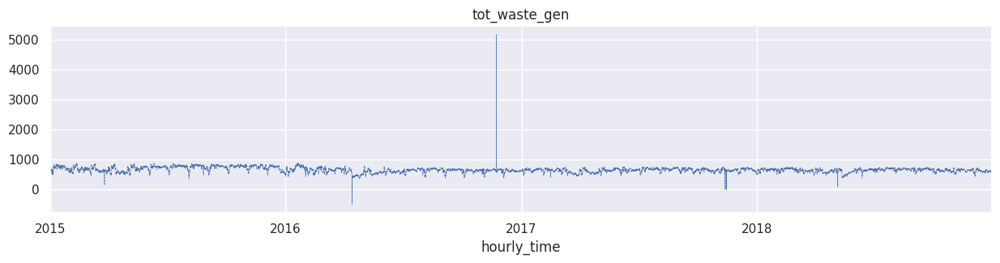

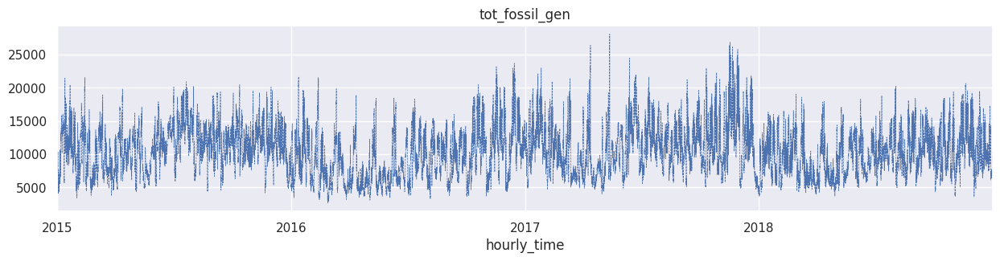

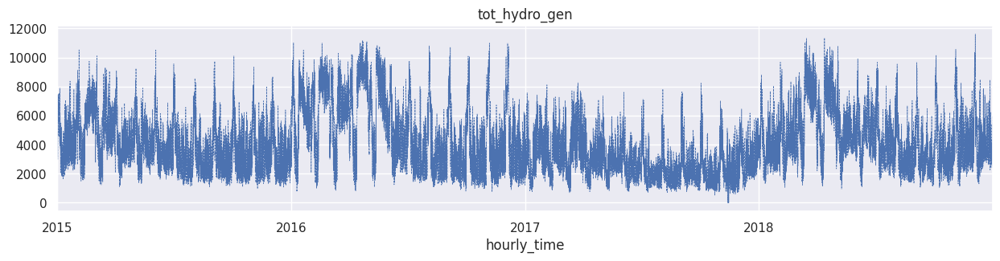

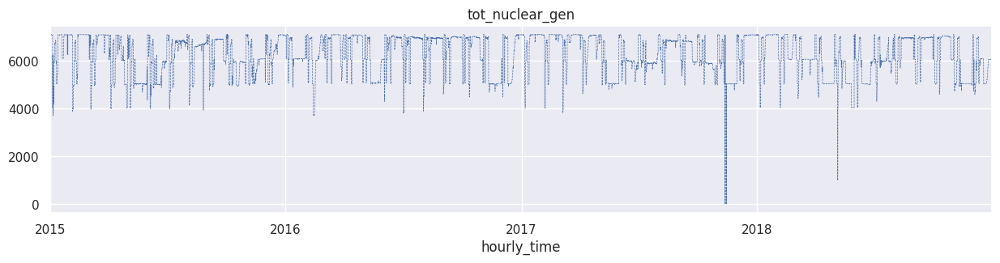

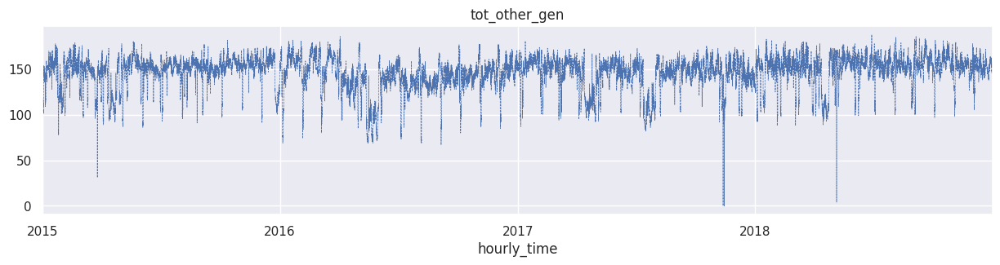

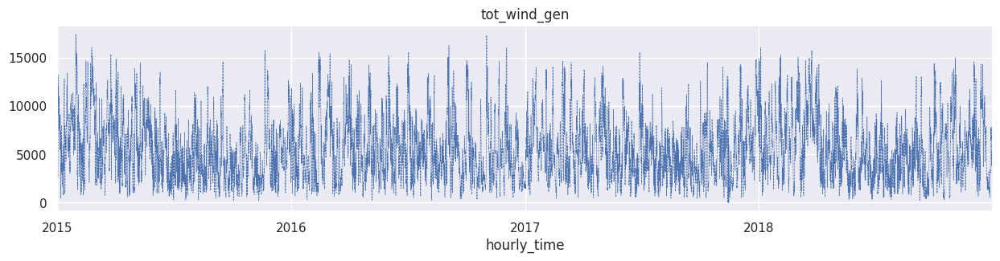

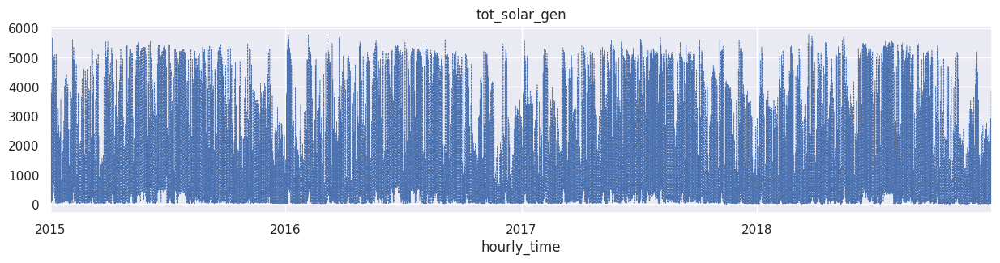

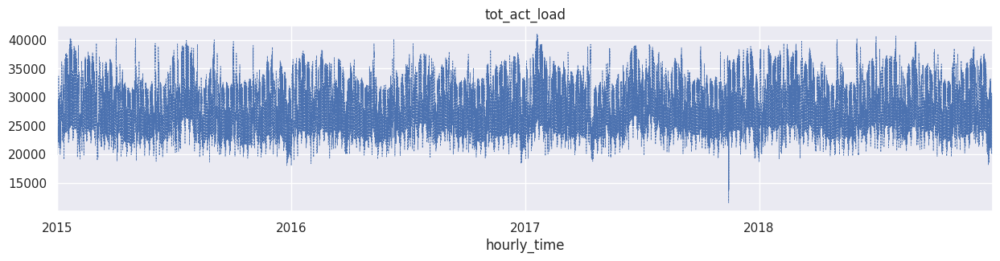

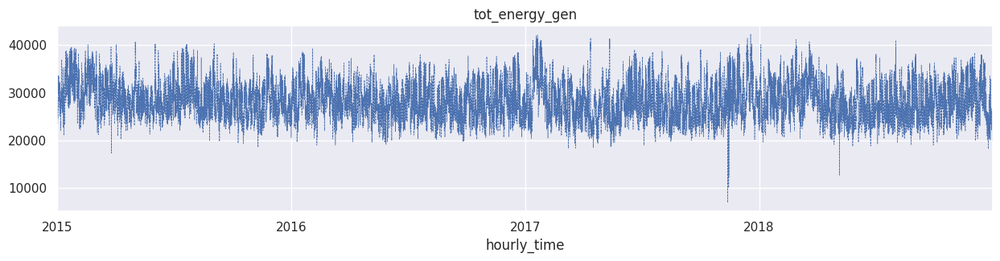

In [ ]:
#creates a plot of each column in out energy dataset for hourly instances through the 4 year period

sns.set(rc={'figure.figsize': (15, 3)})
for column in p_energy_ds.select_dtypes(include=np.number).columns:
    # Exclude non-numeric columns and columns that are not of interest
    if p_energy_ds[column].dtype != 'object' and column != 'datetime' and column != 'year' and column != 'weekday' and column != 'month' and column != 'Is_weekend' and column != 'quarter' and column != 'dayofyear'and column != 'dayofweek'and column != 'hour':
      # Plot the data for the current column
      p_energy_ds[column].plot(linewidth=0.5, ls='--')
      plt.title(column)
      plt.show()

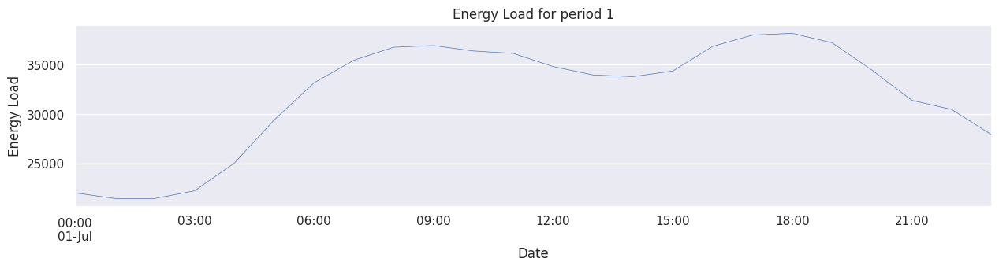

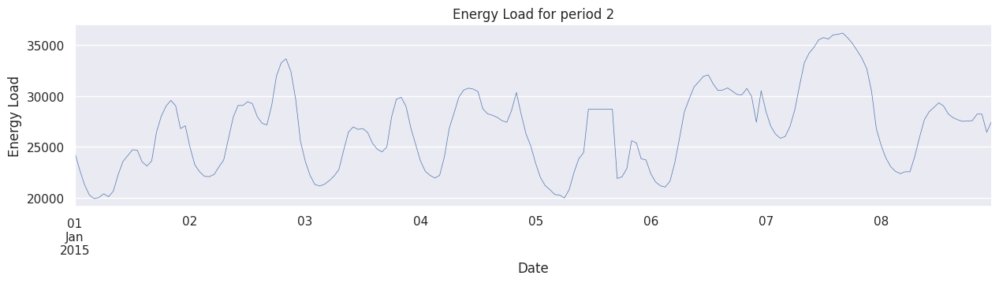

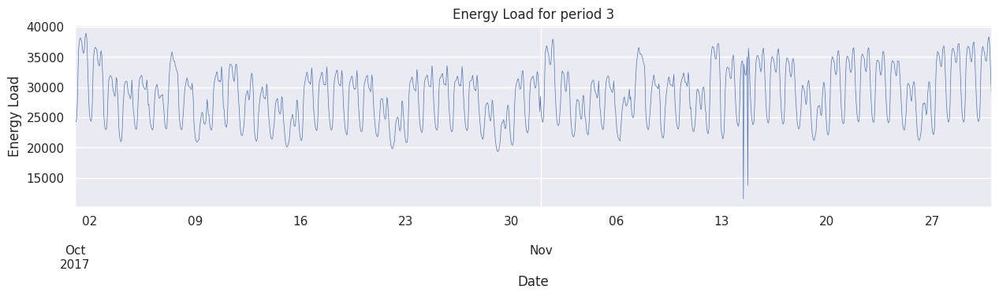

In [ ]:
poi = [("2015-07-01", "2015-07-01"), ("2015-01-01", "2015-01-08"), ("2017-10-01", "2017-11-30")] #poi =periods of interest -one day, one week and outlier suspected period

for i, period in enumerate(poi):
    fig, ax = plt.subplots()
    p_energy_ds.loc[period[0]:period[1], 'tot_act_load'].plot(ax=ax, linewidth=0.5)
    plt.title(f'Energy Load for period {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Energy Load')
    plt.show()

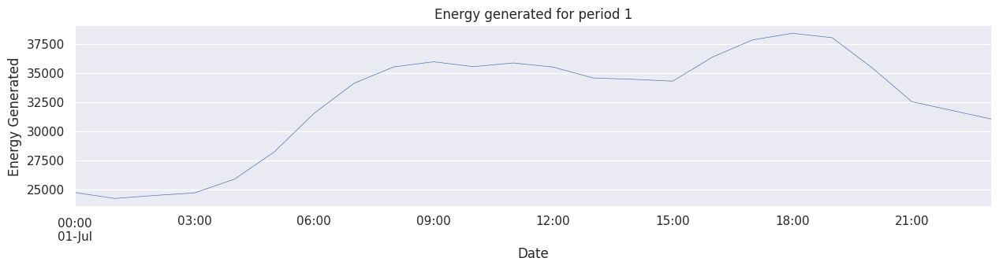

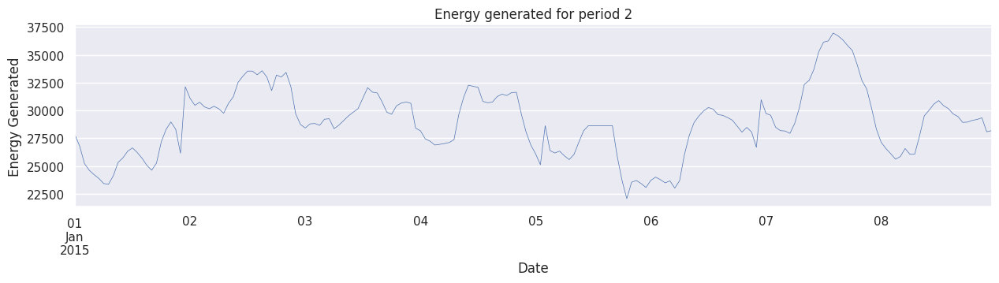

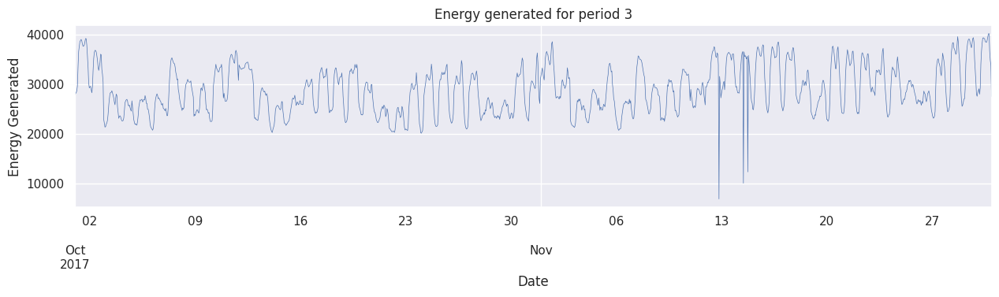

In [ ]:
poi = [("2015-07-01", "2015-07-01"), ("2015-01-01", "2015-01-08"), ("2017-10-01", "2017-11-30")] #poi =periods of interest -0ne day, one week and outlier suspected period

for i, period in enumerate(poi):
    fig, ax = plt.subplots()
    p_energy_ds.loc[period[0]:period[1], 'tot_energy_gen'].plot(ax=ax, linewidth=0.5)
    plt.title(f'Energy generated for period {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Energy Generated')
    plt.show()

## 2.   Weather Dataset Visualisation

In [ ]:

for column in p_weather_ds_val.select_dtypes(include=np.number).columns:
    # Exclude non-numeric columns and columns that are not of interest
    if p_weather_ds_val[column].dtype != 'object' and column != 'datetime' and column != 'year' and column != 'weekday' and column != 'month' and column != 'is_weekend'and column != 'quarter' and column != 'dayofyear'and column != 'dayofweek'and column != 'hour':
        # Plot the data for the current column
        p_weather_ds_val[column].plot(linewidth=0.5)
        plt.title(column)
        plt.show()

In [ ]:
poi = [    ("2015-07-01", "2016-01-01"),      ("2015-01-01", "2015-03-31"),    ("2018-07-01", "2018-11-30") ] #The Start of the year to summer time when temerature increase

#period 1 is The Start of the year to summer time when temerature increase
#period 2 is The mid year to winter time when temerature decrease
#period 3 is temperature drop through the end of the data period

for i, period in enumerate(poi):
    fig, ax = plt.subplots()
    p_weather_ds_val.loc[period[0]:period[1], 'temp'].plot(ax=ax, linewidth=0.5)
    plt.title(f'Temperature for period {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Temperature')
    plt.show()

In [ ]:
poi = [    ("2015-07-01", "2016-01-01"),      ("2015-02-20", "2015-02-24"),    ("2018-07-01", "2018-11-30") ]

#period1 pressure data er for 6months period
#period2 pressure data for suspected outlier period
#period3 pressure data for suspected outlier period

for i, period in enumerate(poi):
    fig, ax = plt.subplots()
    p_weather_ds_val.loc[period[0]:period[1], 'pressure'].plot(ax=ax, linewidth=0.5)
    plt.title(f'pressure for period {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Pressure')
    plt.show()

In [ ]:
poi = [    ("2016-01-01", "2016-01-01"),      ("2015-02-20", "2015-02-24"),    ("2018-07-01", "2018-11-30") ]

for i, period in enumerate(poi):
    fig, ax = plt.subplots()
    p_weather_ds_val.loc[period[0]:period[1], 'humidity'].plot(ax=ax, linewidth=0.5)
    plt.title(f'Humidity for period {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Humidity')
    plt.show()

In [ ]:
poi = [    ("2015-01-01", "2015-03-01"),      ("2017-07-01", "2017-07-30"),    ("2018-07-01", "2018-07-01") ]

for i, period in enumerate(poi):
    fig, ax = plt.subplots()
    p_weather_ds_val.loc[period[0]:period[1], 'wind_speed'].plot(ax=ax, linewidth=0.5)
    plt.title(f'Wind speed for period {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Wind Speed')
    plt.show()

In [ ]:
periods_of_interest = [    ("2015-01-01", "2015-05-01"),      ("2016-07-01", "2016-11-30"),    ("2018-07-01", "2018-07-01") ]

for i, period in enumerate(periods_of_interest):
    fig, ax = plt.subplots()
    p_weather_ds_val.loc[period[0]:period[1], 'rain_3h'].plot(ax=ax, linewidth=0.5)
    plt.title(f'Rain level for period {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Rain Level')
    plt.show()

In [ ]:
poi = [    ("2015-01-01", "2015-07-01"),      ("2016-01-01", "2016-07-30"),    ("2018-07-01", "2018-07-01") ]

for i, period in enumerate(poi):
    fig, ax = plt.subplots()
    p_weather_ds_val.loc[period[0]:period[1], 'snow_3h'].plot(ax=ax, linewidth=0.5)
    plt.title(f'Snow level for period {i+1}')
    plt.xlabel('Date')
    plt.ylabel('Snow Level')
    plt.show()

# Outlier Analysis

1.   Energy dataset outlier analysis
2.   Weather dataset outlier analysis



## 1.   Energy dataset outlier analysis

In [ ]:
#outlier detail
#an expansive plot on the suspect outlier time shows thats the sudden deep islegitmate data and should be used
ax = p_energy_ds.loc['2018-07-10' : '2018-07-12', 'tot_energy_gen'].plot(marker='o', linestyle='-')
ax.set_ylabel('Energy generation');

An expansive plot on the suspect outlier time shows thats the sudden deep is legitmate data and should be used in our model.

In [ ]:
p_energy_ds['tot_act_load'].plot(kind='hist', bins =100)

In [ ]:
p_energy_ds_qry = p_energy_ds.drop(columns=['tot_energy_gen', 'tot_waste_gen', 'tot_fossil_gen', 'tot_hydro_gen', 'tot_nuclear_gen','tot_other_gen', 'tot_wind_gen', 'tot_solar_gen', 'hour', 'dayofweek', 'quarter', 'year', 'dayofyear', 'month', 'weekday_name', 'weekday', 'is_weekend'])
p_energy_ds_qry.query('tot_act_load <19000').plot(figsize=(15,5), style='.')

From the bar charts, it is evident that theremay be outlier events within data less than 19000. This show the outlier events in total actual load with the most awkward occuring at the start of 2018

## 2.   Weather dataset outlier analysis

In [ ]:
for column in p_weather_ds_val.select_dtypes(include=['float64', 'int64']).columns:
  if p_weather_ds_val[column].dtype != 'object' and column != 'datetime' and column != 'year' and column != 'weekday' and column != 'month' and column != 'Is_weekend' and column != 'quarter' and column != 'dayofyear'and column != 'dayofweek'and column != 'hour':
    p_weather_ds_val[column].plot(kind='hist', bins=100)
    plt.title(column)
    plt.show()

It is evident that the climate parameters except for temperature do not follow normal distribution and such can not be accesed for outliers. Weather is constantly changing and highly variable and this is the major reason for this.

# Time-Series Analysis and Visualization

1.   Energy Dataset Time-Series Analysis and Visualization
2.   Weather Dataset Time-Series Analysis and Visualization



## 1.   Energy Dataset Time-Series Analysis and Visualization

In [ ]:
#plot of daily average of some generation data set for entire period of dataset
cols_plot = ['tot_energy_gen', 'tot_nuclear_gen', 'tot_fossil_gen', 'tot_waste_gen']
fig, axes = plt.subplots(nrows=len(cols_plot), figsize=(12, 4*len(cols_plot)))
p_energy_ds[cols_plot].resample('D').mean().plot(marker='.', linestyle='None', ax=axes, subplots=True)

for ax in axes:
    ax.set_ylabel('daily total gen')

In [ ]:
# Plot of daily average of actual energy load data set for entire period of dataset
fig, ax = plt.subplots()
p_energy_ds['tot_act_load'].resample('D').mean().plot(marker='.', linestyle='None', ax=ax)
ax.set_ylabel('Daily Average Actual Energy Load')
plt.show()


In [ ]:
# Plot of Monthly average of actual energy load data set for entire period of dataset
fig, ax = plt.subplots()
p_energy_ds['tot_act_load'].resample('M').mean().plot(marker='.', linestyle='None', ax=ax)
ax.set_ylabel('Monthly Average Actual Energy Load')
plt.show()


In [ ]:
#2017 plot of both actual load and power generated
ax = p_energy_ds.loc['2017', ['tot_energy_gen', 'tot_act_load']].plot()
ax.set_ylabel('daily generation vs load')
ax.set_title("2017 power generation and load")
ax.legend(['Total Energy Generation', 'Actual Load'], loc='best')
ax.lines[1].set_alpha(0.3) # making the tot_act_load line transparent



In [ ]:
#2016 plot of both actual load and power generated
ax = p_energy_ds.loc['2016', ['tot_energy_gen', 'tot_act_load']].plot()
ax.set_ylabel('daily generation vs load')
ax.set_title("2016 power generation and load")
ax.legend(['Total Energy Generation', 'Actual Load'], loc='best')
ax.lines[1].set_alpha(0.3) # making the tot_act_load line transparent



In [ ]:
#2018 plot of both actual load and power generated
ax = p_energy_ds.loc['2018', ['tot_energy_gen', 'tot_act_load']].plot()
ax.set_ylabel('daily generation vs load')
ax.set_title("2018 power generation and load")
ax.legend(['Total Energy Generation', 'Actual Load'], loc='best')
ax.lines[1].set_alpha(0.3) # making the tot_act_load line transparent



In [ ]:
#2016 moving monthly avareage of total energy generated and actual load
p_energy_ds.loc['2016', [ 'tot_act_load', 'tot_energy_gen', 'month']].groupby("month").mean().plot()

In [ ]:
#2017 moving monthly avareage of total energy generated and actual load
p_energy_ds.loc['2017', [ 'tot_act_load', 'tot_energy_gen', 'month']].groupby("month").mean().plot()

In [ ]:
#2016 moving monthly avareage of total energy generated and actual load
p_energy_ds.loc['2018', [ 'tot_act_load', 'tot_energy_gen', 'month']].groupby("month").mean().plot()

A closer look at the data on a monthly scale, shows a trend that the power distribution system is normally challenged with generating enough power for the demand load within the 4th and 10th month yearly.

In [ ]:
mean_by_weekday = p_energy_ds.loc['2017', ['tot_act_load', 'tot_energy_gen', 'weekday']].groupby('weekday').mean()
mean_by_weekday

In [ ]:
mean_by_weekday.plot()

This shows the trend that the power distribution system are constanly been challenged with been able to generate enough power for required demanded load. The graphs show that the generating system is only able to to cater for the load mostly on the 6th day of the week which is saturday when the energy requirements or demand is at its lowest.



In [ ]:
fig, axes = plt.subplots(5, 1, figsize=(11,10), sharex = True)
for name, ax in zip(['tot_energy_gen', 'tot_nuclear_gen', 'tot_fossil_gen', 'tot_waste_gen', 'tot_solar_gen'], axes):
    sns.boxplot(data=p_energy_ds.loc['2017'], x='month', y =name, ax = ax)
    ax.set_ylabel('KWH')
    ax.set_title(name)
    if ax !=axes[-1]:
        ax.set_xlabel('')

This represenst only 2017 data but a quick look at other years shows similar trends. The dataset generally depicts changes and wave-like systems especially as seen in the tot_energy_ds box plots. Another plot worthy of note is the tot_solar_gen plot which show peaks mostly in the summer period where more sunshine is able to produce increased power upto 4000kwh and less than 2000kwh Decemeber and janury periods.

In [ ]:
sns.boxplot(data=p_energy_ds.loc['2017'], x ='weekday_name', y ='tot_energy_gen');

In [ ]:
sns.boxplot(data=p_energy_ds.loc['2017'], x ='weekday_name', y ='tot_act_load');

This Shows peaked load and power generation during the weekdays, while both generation and actual loads deuce in values during the weekends. Theis shows that the location is a highly commercialised enviroment with less activities during the weekends

In [ ]:
#weekly resampling- downsampling
col_data = ['tot_act_load', 'tot_energy_gen', 'tot_wind_gen', 'tot_solar_gen', 'tot_fossil_gen', 'tot_solar_gen']
p_energy_ds_mean = p_energy_ds[col_data].resample('W').mean()
p_energy_ds_mean.tail(3)

In [ ]:
# this plots the eenrgy demand data from January to June 2017 in two different ways: daily data and weekly mean resampled data.

start, end = '2017-01', '2017-06'

fig, ax = plt.subplots()
ax.plot(p_energy_ds.loc[start: end, 'tot_act_load'],
        marker='.', linestyle='-', linewidth=0.5, label = 'Daily')
ax.plot(p_energy_ds_mean.loc[start: end, 'tot_act_load'],
        marker='o', markersize =8, linestyle='-', label = 'Weekly Mean Resample')
ax.set_ylabel('Actual Energy Demand')
ax.legend();

In [ ]:
# this plots the solar energy generation data from January to June 2017 in two different ways: daily data and weekly mean resampled data.
start, end = '2017-01', '2017-06'

fig, ax = plt.subplots()
ax.plot(p_energy_ds.loc[start: end, 'tot_solar_gen'],
        marker='.', linestyle='-', linewidth=0.5, label = 'Daily')
ax.plot(p_energy_ds_mean.loc[start: end, 'tot_solar_gen'],
        marker='o', markersize =8, linestyle='-', label = 'Weekly Mean Resample')
ax.set_ylabel('Solar Generation')
ax.legend();

In [ ]:
# this plots the total energy data from January to June 2017 in two different ways: daily data and weekly mean resampled data.
start, end = '2017-01', '2017-06'

fig, ax = plt.subplots()
ax.plot(p_energy_ds.loc[start: end, 'tot_energy_gen'],
        marker='.', linestyle='-', linewidth=0.5, label = 'Daily')
ax.plot(p_energy_ds_mean.loc[start: end, 'tot_energy_gen'],
        marker='o', markersize =8, linestyle='-', label = 'Weekly Mean Resample')
ax.set_ylabel('Total Generation')
ax.legend();

In [ ]:
#7days rolling mean
p_energy_ds_7d = p_energy_ds[col_data].rolling(7, center=False).mean()
p_energy_ds_7d.head(10)

In [ ]:
start, end = '2017-01', '2017-06'

fig, ax = plt.subplots()
ax.plot(p_energy_ds.loc[start: end, 'tot_act_load'],
        marker='.', linestyle='-', linewidth=0.5, alpha=0.5, label = 'Daily', color='blue')
ax.plot(p_energy_ds_mean.loc[start: end, 'tot_act_load'],
        marker='o', markersize =8, linestyle='-', label = 'Weekly Mean Resample', color='orange')
ax.plot(p_energy_ds_7d.loc[start:end,'tot_act_load'],
       marker='.', linestyle='-', alpha=0.8, label='7-days Rolling mean', color='green')
ax.set_ylabel('Actual Energy Demand')
ax.legend();


In [ ]:
#Trend observation

p_energy_ds_365d = p_energy_ds[col_data].rolling(window=365, center=False).mean()
p_energy_ds_365d

In [ ]:
fig, ax=plt.subplots(figsize=(14,4))
ax.plot(p_energy_ds['tot_act_load'],
        marker='.', markersize=2, color='0.6', linestyle='None', label = 'Daily')

ax.plot(p_energy_ds_7d['tot_act_load'],
        linewidth=2, label='7-daysRolling mean')

ax.plot(p_energy_ds_365d['tot_act_load'], color ='0.2', linewidth=3,
        label='Trend(365d Rolling Mean)')

ax.xaxis.set_major_locator(mdates.YearLocator())
ax.legend()
ax.set_xlabel('Year')
ax.set_ylabel('tot_solar_load')
ax.set_title('Trend in Energy Demand-Daily-Weekly-Yearly Rolling mean');

## 2.   Weather Dataset Time-Series Analysis and Visualization

In [ ]:
#plot of daily avergae of some weather data set for entire period of dataset
cols_plot = ['temp', 'pressure', 'humidity', 'wind_speed', 'rain_1h', 'snow_3h']
fig, axes = plt.subplots(nrows=len(cols_plot), figsize=(12, 2*len(cols_plot)))
p_weather_ds_val[cols_plot].resample('D').mean().plot(marker='.', linestyle='None', ax=axes, subplots=True)

for ax in axes:
    ax.set_ylabel('avg weather')

The mean average weather plots shows some trends which in actual life proves correct. The plot for both temperature and humidity flows in opposite showing that at times when the temperature is hotest, there will be low humidity and at times when the weather is coldest, then the weather is more humid. There is also a clear sign of increased pressure, wind speed, rain and snow at the beginning of 2015 which seems more like an outlier event because same occurences cannot be found in preceeding years.

In [ ]:
p_weather_ds_val.loc['2015', [ 'temp', 'pressure', 'humidity', 'wind_speed', 'rain_1h', 'snow_3h', 'month']].groupby("month").mean().plot()

In [ ]:
p_weather_ds_val.loc['2016', [ 'temp', 'pressure', 'humidity', 'wind_speed', 'rain_1h', 'snow_3h', 'month']].groupby("month").mean().plot()

In [ ]:
p_weather_ds_val.loc['2017', [ 'temp', 'pressure', 'humidity', 'wind_speed', 'rain_1h', 'snow_3h', 'month']].groupby("month").mean().plot()

The plots shows a smoothing and parrallel monthly average weather data throught out the years with the exception of the year 2015 monthly plots which again identifies and elaborates the outlier event at the begining of 2015.

# Stationary Testing

In [ ]:
y_demand = p_energy_ds['tot_act_load']
adf_test = adfuller(y_demand, regression='c')
print('ADF Statistic: {:.6f}\np-value: {:.6f}\n#Lags used: {}'
      .format(adf_test[0], adf_test[1], adf_test[2]))
for key, value in adf_test[4].items():
    print('Critical Value ({}): {:.6f}'.format(key, value))

The Augmented Dickey-Fuller (ADF) test, a type of unit root test, determines how strongly a time series is defined by a trend. Its hypotheses are the following:

Null Hypothesis  H0
 : There is a unit root in the time series, i.e. the series is autocorrelated with (r=1), a time dependent structure and thus, is not stationary.
Alternate Hypothesis  H1
 : The time series has no unit root and is either stationary or can be made stationary using differencing.


The Augmented Dickey-Fuller (ADF) test is a statistical test that tests for the presence of a unit root in a time series. A unit root indicates that the time series has a trend and is not stationary.

In the output provided, the ADF Statistic is -21.646033. This value is the test statistic of the ADF test. The more negative the test statistic, the stronger the evidence against the presence of a unit root in the time series. In this case, the test statistic is very negative, which indicates that the time series is likely stationary.

The p-value is 0.000000. This value represents the probability of observing a test statistic as extreme as the one calculated, assuming the null hypothesis that the time series has a unit root. A low p-value (usually less than 0.05) indicates strong evidence against the null hypothesis, which in this case suggests that the time series is stationary.

The #Lags used is 52. This is the number of lags used in the test. The optimal number of lags is usually chosen to minimize the information criterion, such as the Akaike Information Criterion (AIC) or the Bayesian Information Criterion (BIC).

The Critical Values are -3.430537, -2.861623, and -2.566814 for the 1%, 5%, and 10% levels of significance, respectively. These values are used to compare with the ADF Statistic to determine if it falls within the critical region for rejection of the null hypothesis. If the ADF Statistic is less than the critical value at a given level of significance, then the null hypothesis is rejected and the time series is considered stationary.

In [ ]:
kpss_test = kpss(y_demand, regression='c')
print('KPSS Statistic: {:.6f}\np-value: {:.6f}\n#Lags used: {}'
      .format(kpss_test[0], kpss_test[1], kpss_test[2]))
for key, value in kpss_test[3].items():
    print('Critical Value ({}): {:.6f}'.format(key, value))

The Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test, follows the opposite logic from Augmented Dickey-Fuller test and checks for stationarity. Its hypotheses are the following:

Null Hypothesis  H0
 : The time series is level, i.e. it is stationary around a constant.
Alternate Hypothesis  H1
 : There is a unit root in the time series and thus it not stationary.


 The KPSS (Kwiatkowski–Phillips–Schmidt–Shin) test is another popular test used to determine the stationarity of a time series.

The KPSS Statistic is a numerical value that measures the overall deviation of the data from a stationary process. A smaller value of the KPSS Statistic indicates a more stationary time series. The p-value is the probability of obtaining a KPSS Statistic at least as extreme as the one computed from the data, assuming the null hypothesis is true. A p-value less than the significance level (usually 0.05) is an indication to reject the null hypothesis of stationarity.

The number of lags used is a parameter that determines the number of lags to include in the test. It is based on the autocorrelation function of the time series, and a larger number of lags can capture more complex patterns in the data.

The critical values are pre-determined values that define the thresholds for the test statistic, which depend on the significance level of the test. They are used to determine whether the null hypothesis can be rejected or not. The smaller the significance level, the more stringent the test and the lower the critical values.

# Auto, partial, and cross-correlation

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(15,5))

#we will plot the last 30 and 90 days
lags = [7*24, 30*24]

for ax, lag in zip(axs.flatten(), lags):
    plot_acf(p_energy_ds['tot_act_load'], ax=ax, lags=lag)
plt.plot()

Comments on Hourly Sequential (Partial) Autocorrelation Plots¶
In the above plots there is clear autocorrelation between consequtive hours. Nearly every (partial) autoregressive feature is significant as indicated by it's magnitude being larger than the light blue cone. This means the strong influecne between the previous hours and the current state. The difficulty is that there is such a strong correlation, that it is an indication of a low correlation to a moving average process. This means we will have a lot of noise to filter when making predictions using the data in this view. Selecting features is difficult. We see some lookbacks are stronger correlated than others, and this gives us a clue to the features that are of interest. However, we don't know if predicting each hour of the day should use the same features.

In [ ]:
p_energy_ds_ac = p_energy_ds.drop(columns=['hour', 'dayofweek', 'quarter', 'year', 'dayofyear', 'month', 'weekday_name', 'weekday', 'is_weekend'])
p_energy_ds_ac.columns

In [ ]:
plots = len(p_energy_ds_ac.columns)
fig, axs = plt.subplots(int(plots/2), 2, figsize=(15, 2*plots))

for hour, ax in zip(p_energy_ds_ac.columns, axs.flatten()):
  plot_acf(p_energy_ds_ac.loc[:,hour], ax=ax, lags=60)
  ax.set_title('Autocorrelation hour ' + str(hour))
  plt.plot()

In [ ]:
plots = len(p_energy_ds_ac.columns)
fig, axs = plt.subplots(int(plots/2), 2, figsize=(15, 2*plots))

for hour, ax in zip(p_energy_ds_ac.columns, axs.flatten()):
        plot_pacf(p_energy_ds_ac.loc[:,hour], ax=ax, lags=60)
        ax.set_title('Partial Autocorrelation hour ' + str(hour))
plt.plot()

Comments on Hour-by-Hour transformation
Compared with the houly sequetnal plot, the hour-by-hour (partial) autocorrelation plots drop off rapidly. This indicates there is a stronger moving average process present when looking at the data in this way.

Autocorrelation in the hour-by-hour plots.
Hours 2-21 show clear cyclic autocorrelation every 7 days. The cycle of using multiples of 7 days look backs up to about 30-60 days seems like a good feature.
Hours 0-1, and 20-23 have a diffierent structure. Here the corelation is strongest going back the first 21-30 days. The cycle of using multiples of 7 days does not seem as strong. For these hours using the last 21-30 days directly might be a better option.
Partial Autocorrelation
We observe a similar correlation with the cycle of every 7ths day a strong partial autocrrelation. This time there is no clear distinction between the different hourly slices. The strongest partial autocorrelation seen through all the plots appears to be the 28th day. This

In [ ]:
# Plot autocorrelation and partial autocorrelation plots

fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(10, 6))
plot_acf(p_energy_ds['tot_act_load'], lags=50, ax=ax1)
plot_pacf(p_energy_ds['tot_act_load'], lags=50, ax=ax2)
plt.tight_layout()
plt.show()

In [ ]:
cross_corr = ccf(p_energy_ds_ac['tot_act_load'], p_energy_ds_ac['tot_energy_gen'])
plt.plot(cross_corr[0:50])
plt.show()

In [ ]:
# Plot Pearson correlation matrix

correlations = p_energy_ds_ac.corr(method='pearson')
fig = plt.figure(figsize=(12, 12))
sns.heatmap(correlations, annot=True, fmt='.2f')
plt.title('Pearson Correlation Matrix')
plt.show()

# Data Preporcessing, Exploration, Experimenting and modelling

1.   Weather Dataset Preprocessing and modelling
2.   Energy Dataset Preprocessing and modelling






## 1.   Weather Dataset Preprocessing, Exploration, and Modelling

In [ ]:
#dataframes of each city seperated

#p_weather_ds_val = p_weather_ds.loc[p_weather_ds['city_name'] == 'Valencia']
#p_weather_ds_sev = p_weather_ds.loc[p_weather_ds['city_name'] == 'Seville']
#p_weather_ds_mad = p_weather_ds.loc[p_weather_ds['city_name'] == 'Madrid']
#p_weather_ds_Bil = p_weather_ds.loc[p_weather_ds['city_name'] == 'Bilbao']
#p_weather_ds_Bar = p_weather_ds.loc[p_weather_ds['city_name'] == 'Barcelona']

In [ ]:
# Total number of records
n_records = p_weather_ds_val.shape[0]

# Total number of features
n_features = p_weather_ds_val.shape[1]

clear_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '0'].shape[0]
clouds_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '1'].shape[0]
rain_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '2'].shape[0]
mist_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '3'].shape[0]
thunderstorm_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '4'].shape[0]
drizzle_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '5'].shape[0]
fog_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '6'].shape[0]
smoke_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '7'].shape[0]
haze_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '8'].shape[0]
snow_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '9'].shape[0]
dust_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '10'].shape[0]
squall_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == '11'].shape[0]
unknown_weather_outcome = p_weather_ds_val[p_weather_ds_val['weather_outcome'] == 'Na'].shape[0]

percent_cloud =  (clouds_weather_outcome / n_records) * 100
percent_clear =  (clear_weather_outcome / n_records) * 100
percent_rain =  (rain_weather_outcome / n_records) * 100


print("Total number of records: {}".format(n_records))
print("Total number of features: {}".format(n_features))
print("Total records with clear weather outcome: {}".format(clear_weather_outcome))
print("Total records with clouds weather outcome: {}".format(clouds_weather_outcome))
print("Total records with rain weather outcome: {}".format(rain_weather_outcome))
print("Total records with mist weather outcome: {}".format(mist_weather_outcome))
print("Total records with thunderstorm weather outcome: {}".format(thunderstorm_weather_outcome))
print("Total records with drizzle weather outcome: {}".format(drizzle_weather_outcome))
print("Total records with fog weather outcome: {}".format(fog_weather_outcome))
print("Total records with smoke weather outcome: {}".format(smoke_weather_outcome))
print("Total records with haze weather outcome: {}".format(haze_weather_outcome))
print("Total records with snow weather outcome: {}".format(snow_weather_outcome))
print("Total records with dust weather outcome: {}".format(dust_weather_outcome))
print("Total records with squall weather outcome: {}".format(squall_weather_outcome))
print("Total records with unknown weather outcome: {}".format(unknown_weather_outcome))

print("Percentage of cloudy weather outcome: {:.2f}%".format(percent_cloud))
print("Percentage of clear weather outcome: {:.2f}%".format(percent_clear))
print("Percentage of rainy weather outcome: {:.2f}%".format(percent_rain))

In [ ]:
p_weather_ds_val.isna().sum()

In [ ]:
# check duplicates and remove it
print("Before removing duplicates:", p_weather_ds_val.duplicated().sum())

p_weather_ds_val = p_weather_ds_val[~p_weather_ds_val.duplicated()]

print("After removing duplicates:", p_weather_ds_val.duplicated().sum())

In [ ]:
p_weather_ds_val_prep = p_weather_ds_val.copy()
# Scalling
from sklearn.preprocessing import MinMaxScaler
numerical = ['temp', 'temp_min', 'temp_max', 'pressure', 'humidity', 'wind_speed', 'wind_deg', 'rain_1h', 'rain_3h','snow_3h', 'clouds_all', 'hour', 'weekday', 'month', 'quarter', 'year']

#scaler = MinMaxScaler()
#p_weather_ds_val_prep[numerical] = scaler.fit_transform(p_weather_ds_val_prep[numerical])
p_weather_ds_val_prep = p_weather_ds_val_prep.drop(['city_name', 'weather_main', 'weekday_name', 'is_weekend', 'dayofweek', 'dayofyear','temp_min','temp_max', 'clouds_all'], axis=1)
p_weather_ds_val_prep.head(3)

In [ ]:
# Interpolate missing values
p_weather_ds_val_prep.interpolate(method='linear', inplace=True)

In [ ]:
# Encoding
p_weather_ds_val_prep['weather_outcome'] = p_weather_ds_val_prep.weather_outcome.replace({"0": 0.0, "1": 1.0, "2": 2.0, "3": 3.0, "4": 4.0, "5": 5.0, "6": 6.0, "7": 7.0, "8": 8.0, "9": 9.0, "10": 10.0, "11": 11.0})

# Create dummy variables
p_weather_ds_val_prep = pd.get_dummies(p_weather_ds_val_prep)

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
import numpy as np


# Partioning the data
X = p_weather_ds_val_prep.drop('weather_outcome', axis=1)
y = p_weather_ds_val_prep['weather_outcome']


# Oversampling
ros = RandomOverSampler()
X_resampled, y_resampled = ros.fit_resample(X, y)


# Splitting to training and testing
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, stratify=y_resampled, test_size=0.15, random_state=42)







# Models with default parameters
models = {}
models['LogisticRegression'] = LogisticRegression()
models['NaiveBayes'] = GaussianNB()
models['DecisionTree'] = DecisionTreeClassifier()

# Threshold for classification
threshold = 0.5

for model_name in models:
    model = models[model_name]

    # Tuning hyperparameters with Bayesian optimization
    if model_name == 'LogisticRegression':
        params = {'C': Real(1e-6, 1e+6, prior='log-uniform')}

    elif model_name == 'NaiveBayes':
        params = {'var_smoothing': Real(1e-10, 1e-5, prior='log-uniform')}

    elif model_name == 'DecisionTree':
        params = {'max_depth': Integer(3, 15),
                  'min_samples_split': Integer(2, 10),
                  'min_samples_leaf': Integer(1, 4)}

    opt = BayesSearchCV(
        model,
        params,
        cv=5,
        n_iter=50,
        random_state=42,
        verbose=1,
        n_jobs=-1,
        scoring='accuracy'
    )

    opt.fit(X_train, y_train)
    y_pred = opt.predict(X_test)

    # Evaluating performance
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    roc_auc = roc_auc_score(y_test, opt.predict_proba(X_test), average='weighted', multi_class='ovr')

    print(model_name + ":")
    print("Accuracy:" , 'train: ', accuracy, '| test: ', accuracy)
    print("Precision:" , 'train: ', precision, '| test: ', precision)
    print("Recall:" , 'train: ', recall, '| test: ', recall)
    print("ROC-AUC score:" , 'train: ', roc_auc, '| test: ', roc_auc)
    print("---------------------------------------------------------")


## 2.   Energy Dataset Preprocessing and modelling

In [ ]:
#Train/Test Split
train = p_energy_ds['tot_act_load'].loc[p_energy_ds.index < '01-01-2018']
test = p_energy_ds['tot_act_load'].loc[p_energy_ds.index >= '01-01-2018']
fig, ax = plt.subplots(figsize=(15,5))
train.plot(ax=ax, label='TrainSet')
test.plot(ax=ax, label='Test Set')
ax.axvline('01-01-2018', color ='black', ls ='--')
ax.legend(['Training Set', 'Test Set'])
plt.show()

In [ ]:
p_energy_ds.loc[(p_energy_ds.index > '2015-01-01') & (p_energy_ds.index < '2015-01-08'), 'tot_act_load'].plot(title = 'One weeek Data')

In [ ]:
#feature creation----Tmiedate index has been created already

def create_features(p_energy_ds):
    p_energy_ds = p_energy_ds.copy()
    #p_energy_ds.index = pd.to_datetime(p_energy_ds.index)  # Convert index to DatetimeIndex
    #p_energy_ds['hour'] = p_energy_ds.index.hour
    #p_energy_ds['dayofweek'] = p_energy_ds.index.dayofweek
    #p_energy_ds['quarter'] = p_energy_ds.index.quarter
    #p_energy_ds['month'] = p_energy_ds.index.month

    return p_energy_ds

p_energy_ds = create_features(p_energy_ds)

In [ ]:
fig, ax = plt.subplots(figsize = (10,8))
sns.boxplot(data = p_energy_ds, x = 'hour', y = 'tot_act_load')
ax.set_title('MW by Hour')
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize = (10,8))
sns.boxplot(data = p_energy_ds, x = 'month', y = 'tot_act_load')
ax.set_title('MW by Month')
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

train = create_features(train)
test = create_features(test)

FEATURES = ['tot_energy_gen', 'dayofweek', 'quarter', 'hour', 'month', 'year', 'dayofyear']
TARGET = 'tot_act_load'

a_train = p_energy_ds[FEATURES].loc[p_energy_ds.index < '01-01-2018']
b_train = p_energy_ds[TARGET].loc[p_energy_ds.index < '01-01-2018']

a_test = p_energy_ds[FEATURES].loc[p_energy_ds.index >= '01-01-2018']
b_test = p_energy_ds[TARGET].loc[p_energy_ds.index >= '01-01-2018']

reg = xgb.XGBRegressor(n_estimators=10000, early_stopping_rounds=50, learning_rate=0.001)
reg.fit(a_train, b_train, eval_set=[(a_train, b_train), (a_test, b_test)], verbose=200)

# Predict on the test set
y_pred = reg.predict(a_test)

# Print the metrics
print('Mean Squared Error:', mean_squared_error(b_test, y_pred))
print('Mean Absolute Error:', mean_absolute_error(b_test, y_pred))
print('R2 Score:', r2_score(b_test, y_pred))


#Mean Squared Error (MSE) = 2,753,346.001: This is a measure of the average squared difference between the predicted and actual target values. The lower the MSE,
#the better the model's predictions. In this case, the MSE value is quite high, indicating that there may be room for improvement in the model.

#Mean Absolute Error (MAE) = 1,203.172: This is a measure of the average absolute difference between the predicted and actual target values. The lower the MAE,
#the better the model's predictions. In this case, the MAE value is relatively high, indicating that the model's predictions may not be very accurate.

#R2 Score = 0.871: This is a measure of how well the model is able to explain the variability in the target variable. The R2 score ranges from 0 to 1, with a
#value of 1 indicating a perfect fit. In this case, the R2 score is 0.871, indicating that the model is able to explain approximately 87% of the variance in the target variable.
#This is a relatively good score, indicating that the model is able to capture most of the important patterns in the data. However, there may still be some unexplained variability,
#as indicated by the relatively high MSE and MAE values.

### Feature Importance

In [ ]:
#Feature Importance

fi = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns =['importance'])
fi.sort_values('importance').plot(kind='barh', title = 'Feature Importance')
plt.show()

#when the data is highly coreelated, feature importance functionality will not will not tell real importance

In [ ]:
#forcast on Test/model

In [ ]:
test['prediction'] = reg.predict(a_test)

# create a new DataFrame with the prediction array
pred_df = pd.DataFrame(test['prediction'], index=p_energy_ds.index[-len(test['prediction']):], columns=['prediction'])

merged_df = p_energy_ds.copy()
merged_df.loc[:, 'prediction'] = np.nan

# fill the first 8759 rows of the 'predicted_energy' column with the predictions
merged_df.iloc[-len(test['prediction']):, -1] = pred_df['prediction']

In [ ]:
ax = merged_df[['tot_act_load']].plot(figsize=(15,5))
merged_df['prediction'].plot(ax=ax, style='-')
plt.legend(['Raw Data', 'Predictions'])
ax.set_title('Raw Data and prediction')
plt.show()

In [ ]:
ax = merged_df.loc[(merged_df.index > '02-03-2018') & (merged_df.index < '09-03-2018') ]['tot_act_load'].plot(figsize =(15,5),title = 'One Week Data')
merged_df.loc[(merged_df.index >'02-03-2018') & (merged_df.index <'09-03-2018')]['prediction'].plot(style='.')
plt.legend(['Raw Data', 'Prediction'])
plt.show()

In [ ]:
start_date = pd.to_datetime('2018-03-01').tz_localize('UTC')
end_date = pd.to_datetime('2018-03-09').tz_localize('UTC')

ax = merged_df.loc[(merged_df.index > start_date) & (merged_df.index < end_date)]['tot_act_load'].plot(figsize =(15,5),title = 'One Week Data')
merged_df.loc[(merged_df.index > start_date) & (merged_df.index < end_date)]['prediction'].plot(style='.')
plt.legend(['Raw Data', 'Prediction'])
plt.show()


In [ ]:
p_energy_ds_newr= p_energy_ds.drop([ 'tot_waste_gen',	'tot_fossil_gen',	'tot_hydro_gen',	'tot_nuclear_gen',	'tot_other_gen',	'tot_wind_gen',	'tot_solar_gen', 'tot_energy_gen',	'hour',
'dayofweek',	'quarter',	'year',	'dayofyear',	'month',	'weekday_name',	'weekday',	'is_weekend'] , axis=1)
p_energy_ds_newr

In [ ]:
p_weather_ds_val_new = p_weather_ds_val.drop(['city_name', 'temp_min', 'temp_max', 'rain_3h', 'weather_outcome', 'hour', 'dayofweek', 'quarter', 'year', 'dayofyear', 'month', 'weekday_name', 'weekday', 'is_weekend', 'snow_3h',	'clouds_all',	'weather_main'], axis=1)
p_weather_ds_val_new

In [ ]:
# Assuming the time index is already set for both dataframes, you can use the following code to merge them:
p_energy_weather_ds = pd.merge(p_energy_ds_newr, p_weather_ds_val_new , left_index=True, right_index=True, how='inner')

p_energy_weather_ds


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Min-max scale the p_energy_weather_ds DataFrame
scaled_df = pd.DataFrame(scaler.fit_transform(p_energy_weather_ds[['temp', 'tot_act_load']]), columns=['temp', 'tot_act_load'], index=p_energy_weather_ds.index)

# Plot all columns against the time index
fig, ax = plt.subplots(figsize=(15, 5))
for col in scaled_df.columns:
    ax.plot(scaled_df.index, scaled_df[col], label=col)

# Set the title and axis labels
ax.set_title("Weather and Energy Demand Relationship")
ax.set_xlabel("Time Index")
ax.set_ylabel("Scaled Value")

# Add a legend
ax.legend()

# Show the plot
plt.show()


In [ ]:
enwe_regresult = sm.ols(formula="tot_act_load ~ temp + pressure + humidity + wind_speed + wind_deg + rain_1h", data=p_energy_weather_ds).fit()
print(enwe_regresult.params)
print(enwe_regresult.summary())

In [ ]:
pandas_profiling.ProfileReport(p_energy_weather_ds)

### Time Series Cross_Validation

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

tss = TimeSeriesSplit(n_splits=3)

fig, axs = plt.subplots(3, 1 , figsize=(15, 10),
                      sharex=True)

fold=0
for train_idx, val_idx in tss.split(p_energy_ds):
    train = p_energy_ds.iloc[train_idx]
    test = p_energy_ds.iloc[val_idx]
    train['tot_act_load'].plot(ax=axs[fold],
                          label='Training Set',
                          title=f'Data Train/Test Split Fold {fold}')
    test['tot_act_load'].plot(ax=axs[fold],
                         label='Test Set')
    axs[fold].axvline(test.index.min(),color='black', ls='--')
    fold+=1
plt.show()